# Customer Segmentation (Clustering): 
- Utilize clustering algorithms to group customers based on their banking 
behaviors, transaction histories, and demographics.

# Here's a brief description for each column in  DataFrame
- **Customer_I** Unique identifier for each customer.

- **Ag** Age of the customer.

- **Gender** Gender of the customer (categorical: 'Male' or 'Female').

- **Marital_Status** Marital status of the customer (categorical: 'Single', 'Married', 'Divorced').

- **Income** Income of the customer.

- **Total_Transaction_Count** Total number of transactions made by the customer.

- **Total_Transaction_Amount** Total monetary amount spent by the customer in transactions.

- **Average_Transaction_Amount** Average monetary amount per transaction for the customer.

- **Transaction_Frequenc** Frequency of transactions (categorical: 'Daily', 'Weekly', 'Monthly').

- **Online_Banking_Usag** Binary indicator (0 or 1) representing whether the customer uses online banking.

- **ATM_Usage** Number of times the customer uses ATMs.

- **Mobile_App_Usage** Number of times the customer uses the mobile banking app.

- **Num_Active_Banking_Products** Number of active banking products the customer has.

- **Credit_Score** Credit score of the customer.

- **Outstanding_Debt** Amount of outstanding debt for the customer.

- **Num_Savings_Account** Number of savings accounts held by the customer.

- **Investment_Portfolio_Details** Details of the customer's investment portfolio (data type: object).

- **Location** General location information of the customer.

- **State** State of residence for the customer.

- **Zip_Cod** ZIP code of the customer's address.

- **Branch_Proximit** Proximity of the customer to the nearest bank branch.

- **Preferred_Communication_Channel** Preferred communication channel (e.g., 'Email', 'Phone').

- **Preferred_Banking_Channel** Preferred banking channel (e.g., 'Online', 'In-person').

- **Frequency_of_Logins** Frequency of logins to online platforms.

- **Duration_of_Online_Sessions** Duration of online banking sessions.

- **Response_to_Marketing_Campaigns** Response to marketing campaigns (e.g., 'High', 'Medium', 'Low').

- **Length_of_Customer_Relationship** Duration of the customer's relationship with the bank.

- **Churn_Status** Churn status (binary: 0 for no churn, 1 for churn).

- **Overdraft_Incidents** Number of overdraft incidents.

- **Late_Payments** Number of late payments.

- **Feedback_Scores** Scores based on customer feedback.

- **Customer_Service_Interactions** Number of interactions with customer service.

# Importing Libraries 

In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns

In [2]:
df= pd.read_csv("D:\DS NOTE\My external project\Guvi\Clustering\clusterbank.csv")
df

,Customer_ID,Age,Gender,Marital_Status,Income,Total_Transaction_Count,Total_Transaction_Amount,Average_Transaction_Amount,Transaction_Frequency,Online_Banking_Usage,...,Preferred_Banking_Channel,Frequency_of_Logins,Duration_of_Online_Sessions,Response_to_Marketing_Campaigns,Length_of_Customer_Relationship,Churn_Status,Overdraft_Incidents,Late_Payments,Feedback_Scores,Customer_Service_Interactions
0,1,56,Male,Divorced,44327,94,5676.232854,51.084402,Monthly,0,...,In-person,10,10.439830,Medium,45,1,2,1,3,5
1,2,46,Male,Single,30946,90,6513.440818,180.053043,Monthly,0,...,In-person,11,10.177049,High,96,0,0,1,2,1
2,3,32,Male,Single,44693,35,2174.392777,215.346595,Monthly,1,...,Mobile,15,29.940475,High,24,1,0,0,1,3
3,4,60,Female,Married,57241,14,1536.545177,18.291458,Weekly,1,...,Mobile,3,71.606978,Low,60,0,2,1,1,5
4,5,25,Female,Divorced,45540,60,9053.373233,188.829022,Monthly,0,...,Online,14,63.139788,High,117,0,0,1,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,2291,64,Male,Married,80493,74,3889.663651,415.964859,Weekly,1,...,Online,9,119.153390,High,108,1,0,0,1,1
2291,2292,52,Female,Married,66495,83,5932.420691,490.473391,Weekly,0,...,In-person,2,78.284489,Medium,79,0,2,1,1,9
2292,2293,61,Male,Single,43703,84,6511.926626,168.886218,Weekly,1,...,In-person,10,43.438068,Medium,10,0,1,0,2,7
2293,2294,51,Female,Single,83080,28,4572.243360,125.519058,Monthly,1,...,Online,18,33.752765,High,108,1,0,1,5,6


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2295 entries, 0 to 2294
Data columns (total 32 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Customer_ID                      2295 non-null   int64  
 1   Age                              2295 non-null   int64  
 2   Gender                           2295 non-null   object 
 3   Marital_Status                   2295 non-null   object 
 4   Income                           2295 non-null   int64  
 5   Total_Transaction_Count          2295 non-null   int64  
 6   Total_Transaction_Amount         2295 non-null   float64
 7   Average_Transaction_Amount       2295 non-null   float64
 8   Transaction_Frequency            2295 non-null   object 
 9   Online_Banking_Usage             2295 non-null   int64  
 10  ATM_Usage                        2295 non-null   int64  
 11  Mobile_App_Usage                 2295 non-null   int64  
 12  Num_Active_Banking_P

- "The 'Customer_ID' column serves as a unique identifier and does not contribute substantially to the analysis. You may choose to either retain or remove this column based on your preference."

In [4]:
df.head()

,Customer_ID,Age,Gender,Marital_Status,Income,Total_Transaction_Count,Total_Transaction_Amount,Average_Transaction_Amount,Transaction_Frequency,Online_Banking_Usage,...,Preferred_Banking_Channel,Frequency_of_Logins,Duration_of_Online_Sessions,Response_to_Marketing_Campaigns,Length_of_Customer_Relationship,Churn_Status,Overdraft_Incidents,Late_Payments,Feedback_Scores,Customer_Service_Interactions
0,1,56,Male,Divorced,44327,94,5676.232854,51.084402,Monthly,0,...,In-person,10,10.439830,Medium,45,1,2,1,3,5
1,2,46,Male,Single,30946,90,6513.440818,180.053043,Monthly,0,...,In-person,11,10.177049,High,96,0,0,1,2,1
2,3,32,Male,Single,44693,35,2174.392777,215.346595,Monthly,1,...,Mobile,15,29.940475,High,24,1,0,0,1,3
3,4,60,Female,Married,57241,14,1536.545177,18.291458,Weekly,1,...,Mobile,3,71.606978,Low,60,0,2,1,1,5
4,5,25,Female,Divorced,45540,60,9053.373233,188.829022,Monthly,0,...,Online,14,63.139788,High,117,0,0,1,5,1


In [5]:
df.isnull().sum()

Customer_ID                        0
Age                                0
Gender                             0
Marital_Status                     0
Income                             0
Total_Transaction_Count            0
Total_Transaction_Amount           0
Average_Transaction_Amount         0
Transaction_Frequency              0
Online_Banking_Usage               0
ATM_Usage                          0
Mobile_App_Usage                   0
Num_Active_Banking_Products        0
Credit_Score                       0
Outstanding_Debt                   0
Num_Savings_Accounts               0
Investment_Portfolio_Details       0
Location                           0
State                              0
Zip_Code                           0
Branch_Proximity                   0
Preferred_Communication_Channel    0
Preferred_Banking_Channel          0
Frequency_of_Logins                0
Duration_of_Online_Sessions        0
Response_to_Marketing_Campaigns    0
Length_of_Customer_Relationship    0
C

In [6]:
df.duplicated().sum()

0

In [7]:
df.describe()

,Customer_ID,Age,Income,Total_Transaction_Count,Total_Transaction_Amount,Average_Transaction_Amount,Online_Banking_Usage,ATM_Usage,Mobile_App_Usage,Num_Active_Banking_Products,...,Zip_Code,Branch_Proximity,Frequency_of_Logins,Duration_of_Online_Sessions,Length_of_Customer_Relationship,Churn_Status,Overdraft_Incidents,Late_Payments,Feedback_Scores,Customer_Service_Interactions
count,2295.000000,2295.000000,2295.000000,2295.000000,2295.000000,2295.000000,2295.000000,2295.000000,2295.000000,2295.000000,...,2295.000000,2295.000000,2295.000000,2295.000000,2295.000000,2295.000000,2295.000000,2295.000000,2295.000000,2295.000000
mean,1148.000000,41.243137,64023.850545,53.103704,5070.085665,254.375072,0.495861,0.501961,0.513725,2.504575,...,54681.028758,5.474256,9.886710,63.122988,61.584749,0.494989,0.956427,0.507625,2.972113,4.455773
std,662.653756,13.529301,20230.875704,27.321437,2855.842680,141.822569,0.500092,0.500105,0.499921,1.129709,...,25979.410902,2.591907,5.492666,33.490101,33.061442,0.500084,0.817646,0.500051,1.421318,2.849407
min,1.000000,18.000000,30028.000000,5.000000,101.833433,10.500927,0.000000,0.000000,0.000000,1.000000,...,10030.000000,1.000921,1.000000,5.068397,6.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,574.500000,29.000000,46533.500000,29.000000,2663.590682,135.266860,0.000000,0.000000,0.000000,1.000000,...,32064.000000,3.275531,5.000000,34.521683,33.000000,0.000000,0.000000,0.000000,2.000000,2.000000
50%,1148.000000,42.000000,63332.000000,54.000000,5078.146314,253.386004,0.000000,1.000000,1.000000,2.000000,...,53887.000000,5.493540,10.000000,62.859096,62.000000,0.000000,1.000000,1.000000,3.000000,4.000000
75%,1721.500000,53.000000,81034.000000,77.000000,7531.136301,376.568838,1.000000,1.000000,1.000000,4.000000,...,75991.000000,7.726235,15.000000,92.611210,91.000000,1.000000,2.000000,1.000000,4.000000,7.000000
max,2295.000000,64.000000,99959.000000,99.000000,9997.438595,499.821456,1.000000,1.000000,1.000000,4.000000,...,99974.000000,9.992579,19.000000,119.856194,119.000000,1.000000,2.000000,1.000000,5.000000,9.000000


In [8]:
df.columns

Index(['Customer_ID', 'Age', 'Gender', 'Marital_Status', 'Income',
       'Total_Transaction_Count', 'Total_Transaction_Amount',
       'Average_Transaction_Amount', 'Transaction_Frequency',
       'Online_Banking_Usage', 'ATM_Usage', 'Mobile_App_Usage',
       'Num_Active_Banking_Products', 'Credit_Score', 'Outstanding_Debt',
       'Num_Savings_Accounts', 'Investment_Portfolio_Details', 'Location',
       'State', 'Zip_Code', 'Branch_Proximity',
       'Preferred_Communication_Channel', 'Preferred_Banking_Channel',
       'Frequency_of_Logins', 'Duration_of_Online_Sessions',
       'Response_to_Marketing_Campaigns', 'Length_of_Customer_Relationship',
       'Churn_Status', 'Overdraft_Incidents', 'Late_Payments',
       'Feedback_Scores', 'Customer_Service_Interactions'],
      dtype='object')

# Denoting Outlier 

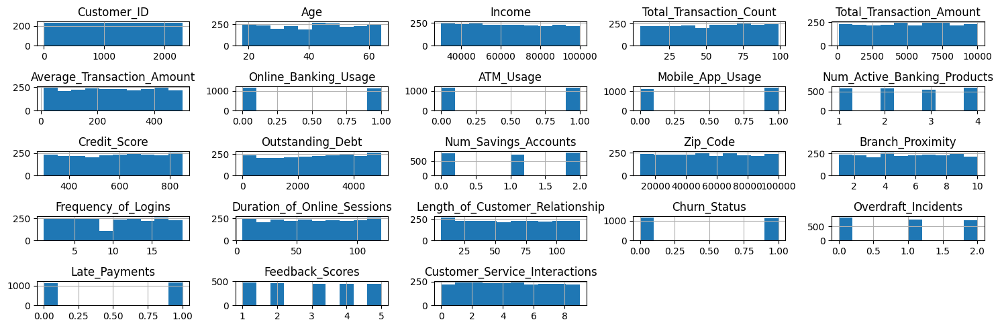

In [9]:
df.hist(figsize=(15, 5))
plt.tight_layout()
plt.show()

# Univariate analysis

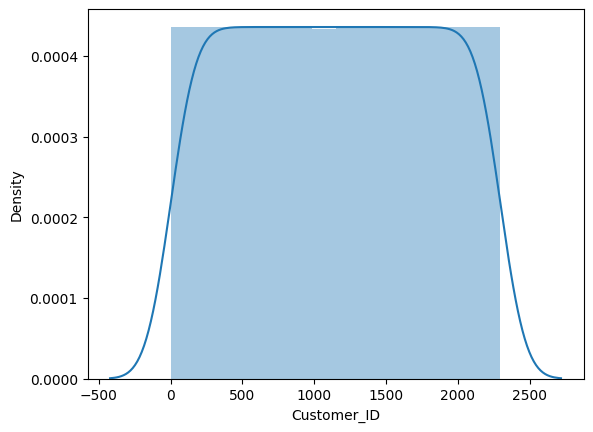

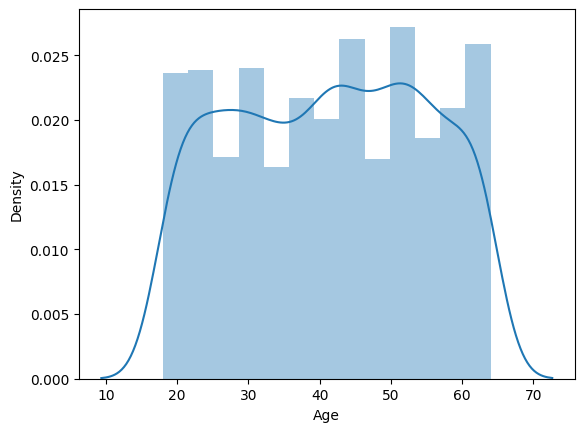

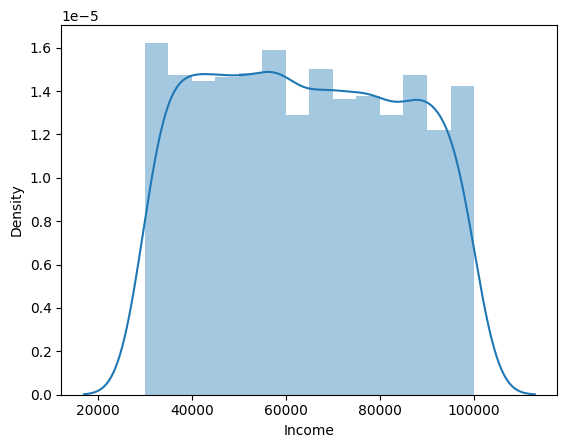

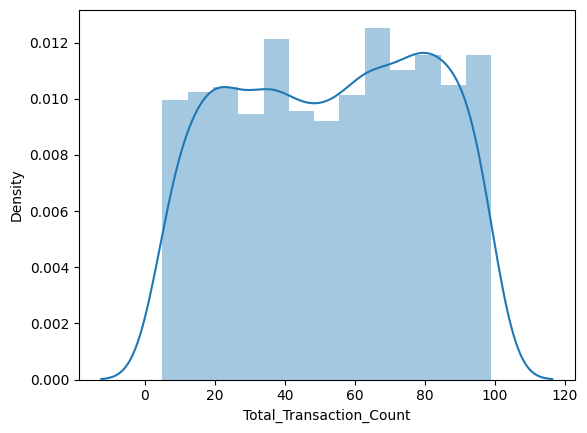

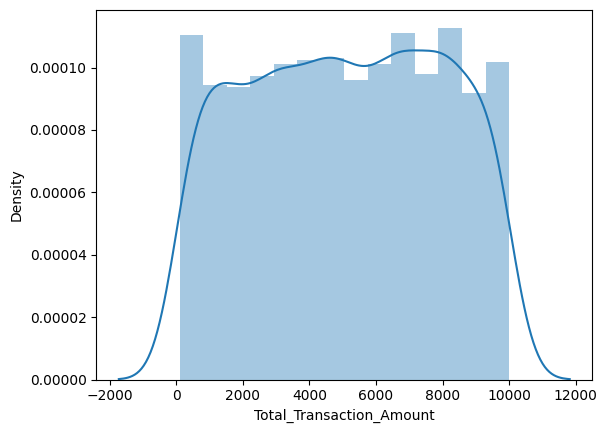

...

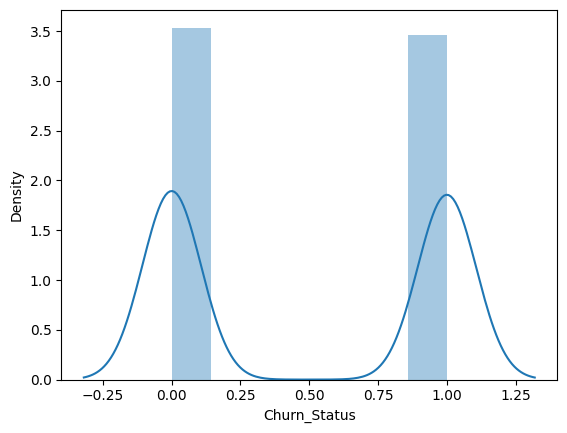

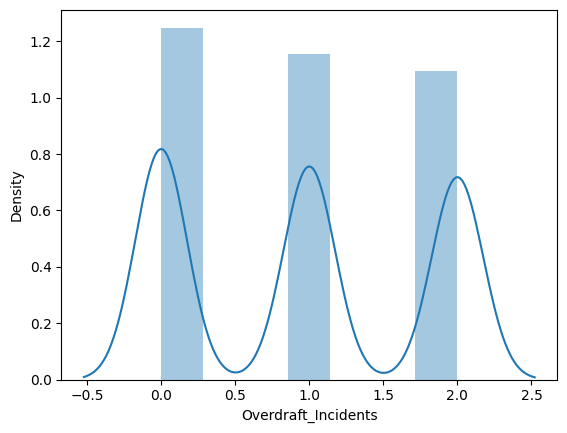

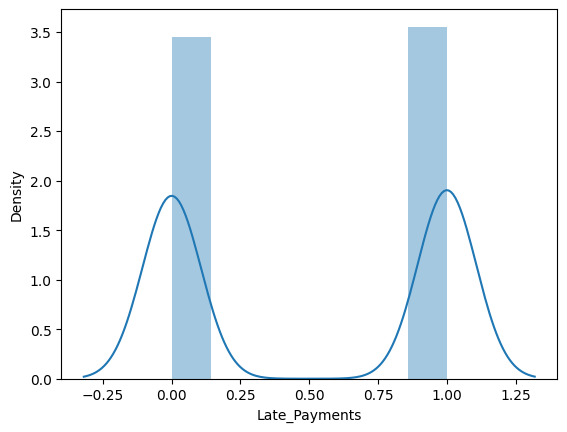

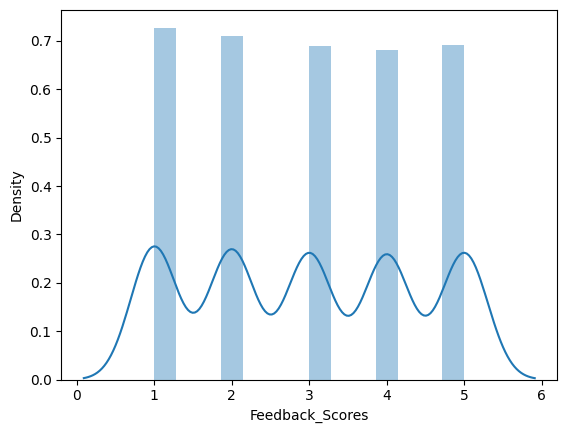

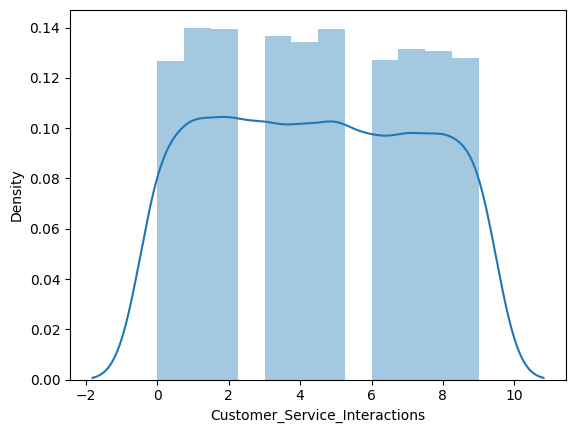

In [10]:
# Use distplot for numerical columns
for col in df.select_dtypes(include=np.number).columns:
    sns.distplot(df[col])
    plt.show()
    

# Bivariate analysis

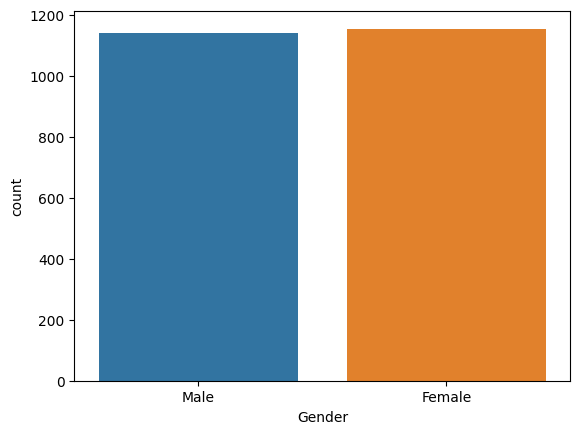

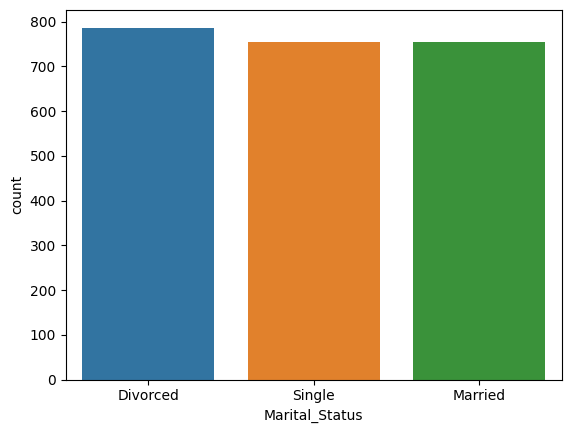

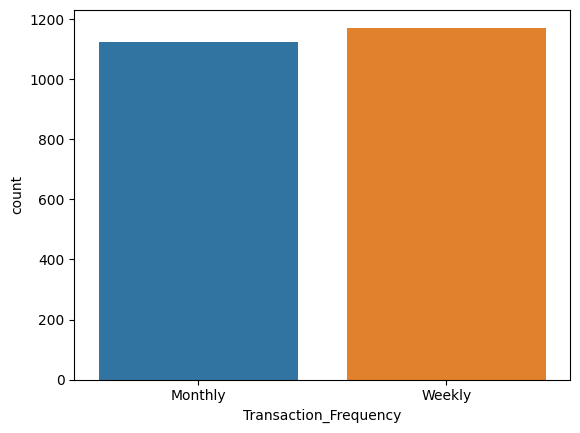

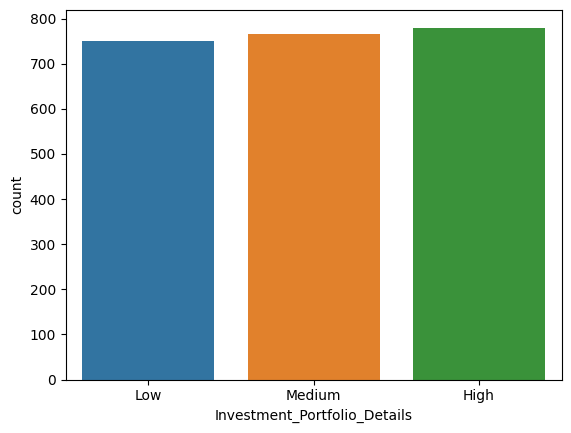

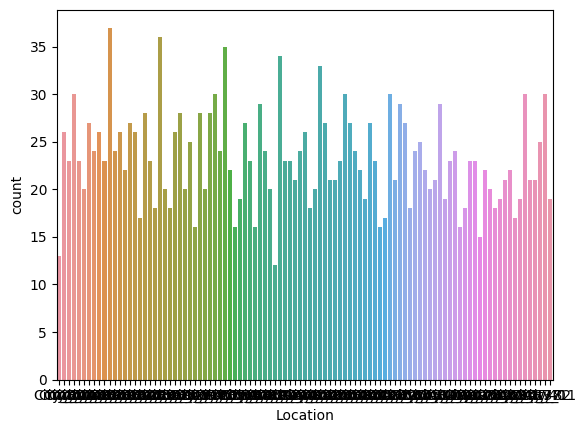

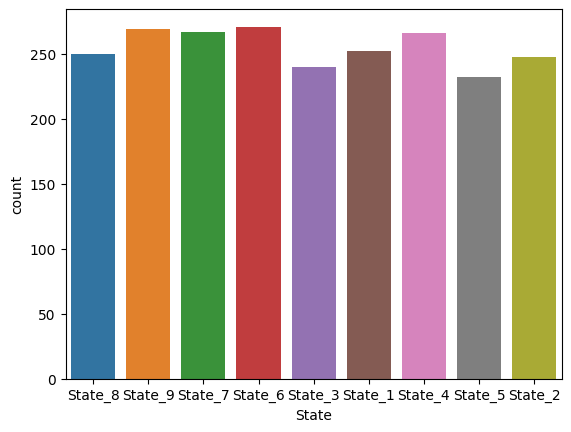

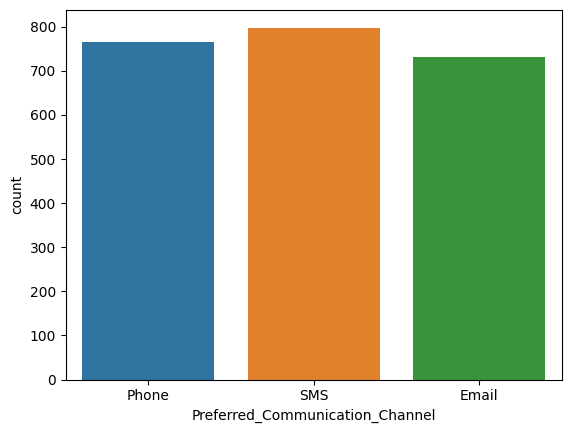

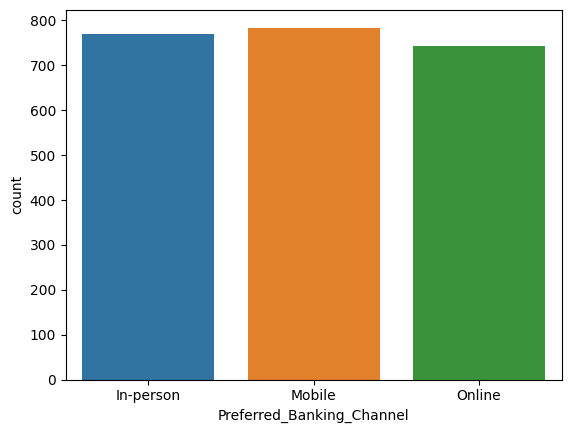

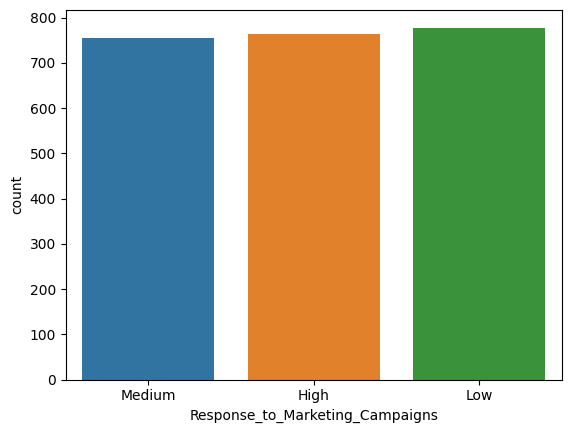

In [11]:
# Use count plot for categorical columns
for col in df.select_dtypes(include='object').columns:
    sns.countplot(data=df, x=col)
    plt.show()

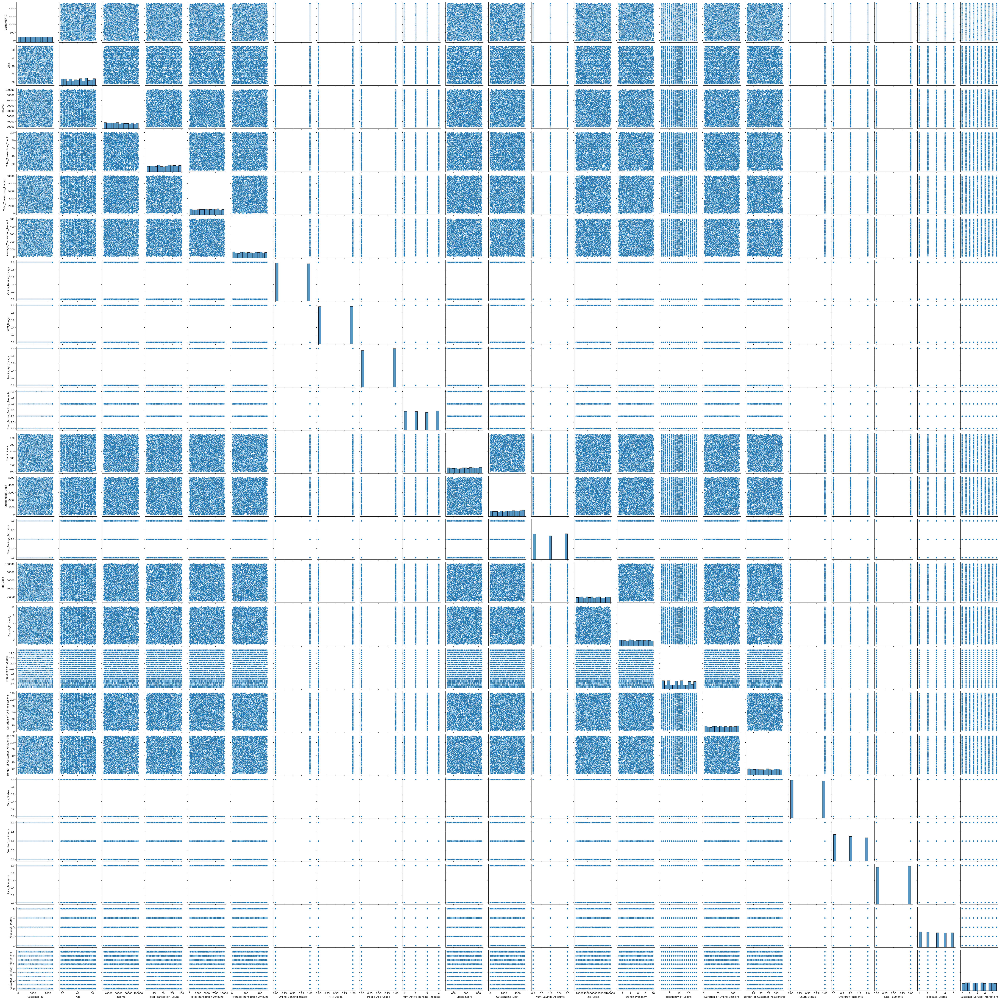

In [12]:
# Use pairplot for numerical columns
sns.pairplot(df.select_dtypes(include=np.number))
plt.show()

In [13]:
# Depending on your domain knowledge, create new features if needed
# Example: Creating a new feature 'Transaction_Percentage' as a percentage of Total_Transaction_Amount over Income
df['Transaction_Percentage'] = df['Total_Transaction_Amount'] / df['Income']
df['Transaction_Percentage']

0       0.128054
1       0.210478
2       0.048652
3       0.026843
4       0.198800
          ...   
2290    0.048323
2291    0.089216
2292    0.149004
2293    0.055034
2294    0.159336
Name: Transaction_Percentage, Length: 2295, dtype: float64

# Separating categorical and numerical columns:
-  **We have categorized the columns into two groups: numerical columns, which contain quantitative data such as age and income, and categorical columns, which include non-numeric data such as gender and marital status**


In [14]:
# Assuming df is your DataFrame
categorical_columns = df.select_dtypes(include=['object']).columns
numerical_columns = df.select_dtypes(exclude=['object']).columns

# Create new DataFrames for categorical and numerical data
df_categorical = df[categorical_columns]
df_numerical = df[numerical_columns]

In [15]:
df_categorical

,Gender,Marital_Status,Transaction_Frequency,Investment_Portfolio_Details,Location,State,Preferred_Communication_Channel,Preferred_Banking_Channel,Response_to_Marketing_Campaigns
0,Male,Divorced,Monthly,Low,City_80,State_8,Phone,In-person,Medium
1,Male,Single,Monthly,Low,City_50,State_9,Phone,In-person,High
2,Male,Single,Monthly,Medium,City_24,State_7,SMS,Mobile,High
3,Female,Married,Weekly,Medium,City_17,State_6,Email,Mobile,Low
4,Female,Divorced,Monthly,Medium,City_18,State_7,Phone,Online,High
...,...,...,...,...,...,...,...,...,...
2290,Male,Married,Weekly,Low,City_69,State_8,Email,Online,High
2291,Female,Married,Weekly,Low,City_80,State_1,Email,In-person,Medium
2292,Male,Single,Weekly,Medium,City_40,State_8,Phone,In-person,Medium
2293,Female,Single,Monthly,Medium,City_24,State_3,Phone,Online,High


In [16]:
df_numerical

,Customer_ID,Age,Income,Total_Transaction_Count,Total_Transaction_Amount,Average_Transaction_Amount,Online_Banking_Usage,ATM_Usage,Mobile_App_Usage,Num_Active_Banking_Products,...,Branch_Proximity,Frequency_of_Logins,Duration_of_Online_Sessions,Length_of_Customer_Relationship,Churn_Status,Overdraft_Incidents,Late_Payments,Feedback_Scores,Customer_Service_Interactions,Transaction_Percentage
0,1,56,44327,94,5676.232854,51.084402,0,1,0,4,...,3.184778,10,10.439830,45,1,2,1,3,5,0.128054
1,2,46,30946,90,6513.440818,180.053043,0,1,1,1,...,6.177272,11,10.177049,96,0,0,1,2,1,0.210478
2,3,32,44693,35,2174.392777,215.346595,1,1,0,1,...,2.936359,15,29.940475,24,1,0,0,1,3,0.048652
3,4,60,57241,14,1536.545177,18.291458,1,1,1,2,...,9.464891,3,71.606978,60,0,2,1,1,5,0.026843
4,5,25,45540,60,9053.373233,188.829022,0,1,0,4,...,3.333289,14,63.139788,117,0,0,1,5,1,0.198800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,2291,64,80493,74,3889.663651,415.964859,1,1,0,4,...,3.818571,9,119.153390,108,1,0,0,1,1,0.048323
2291,2292,52,66495,83,5932.420691,490.473391,0,1,0,4,...,5.860059,2,78.284489,79,0,2,1,1,9,0.089216
2292,2293,61,43703,84,6511.926626,168.886218,1,1,0,4,...,1.952017,10,43.438068,10,0,1,0,2,7,0.149004
2293,2294,51,83080,28,4572.243360,125.519058,1,1,0,4,...,3.079376,18,33.752765,108,1,0,1,5,6,0.055034


# Feature encoding
- Encode the categorical columns 

In [17]:
from sklearn.preprocessing import OrdinalEncoder
ord=OrdinalEncoder()
ordinal_encoded=ord.fit(df_categorical)
ordinal_encoded

OrdinalEncoder()

In [18]:
ordinal_encoded=ord.transform(df_categorical)
ordinal_encoded_df=pd.DataFrame(ordinal_encoded,columns=df_categorical.columns)
ordinal_encoded_df

,Gender,Marital_Status,Transaction_Frequency,Investment_Portfolio_Details,Location,State,Preferred_Communication_Channel,Preferred_Banking_Channel,Response_to_Marketing_Campaigns
0,1.0,0.0,0.0,1.0,78.0,7.0,1.0,0.0,2.0
1,1.0,2.0,0.0,1.0,45.0,8.0,1.0,0.0,0.0
2,1.0,2.0,0.0,2.0,16.0,6.0,2.0,1.0,0.0
3,0.0,1.0,1.0,2.0,8.0,5.0,0.0,1.0,1.0
4,0.0,0.0,0.0,2.0,9.0,6.0,1.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...
2290,1.0,1.0,1.0,1.0,65.0,7.0,0.0,2.0,0.0
2291,0.0,1.0,1.0,1.0,78.0,0.0,0.0,0.0,2.0
2292,1.0,2.0,1.0,2.0,34.0,7.0,1.0,0.0,2.0
2293,0.0,2.0,0.0,2.0,16.0,2.0,1.0,2.0,0.0


In [19]:
df1=pd.concat([ordinal_encoded_df,df_numerical],axis=1)
df1

,Gender,Marital_Status,Transaction_Frequency,Investment_Portfolio_Details,Location,State,Preferred_Communication_Channel,Preferred_Banking_Channel,Response_to_Marketing_Campaigns,Customer_ID,...,Branch_Proximity,Frequency_of_Logins,Duration_of_Online_Sessions,Length_of_Customer_Relationship,Churn_Status,Overdraft_Incidents,Late_Payments,Feedback_Scores,Customer_Service_Interactions,Transaction_Percentage
0,1.0,0.0,0.0,1.0,78.0,7.0,1.0,0.0,2.0,1,...,3.184778,10,10.439830,45,1,2,1,3,5,0.128054
1,1.0,2.0,0.0,1.0,45.0,8.0,1.0,0.0,0.0,2,...,6.177272,11,10.177049,96,0,0,1,2,1,0.210478
2,1.0,2.0,0.0,2.0,16.0,6.0,2.0,1.0,0.0,3,...,2.936359,15,29.940475,24,1,0,0,1,3,0.048652
3,0.0,1.0,1.0,2.0,8.0,5.0,0.0,1.0,1.0,4,...,9.464891,3,71.606978,60,0,2,1,1,5,0.026843
4,0.0,0.0,0.0,2.0,9.0,6.0,1.0,2.0,0.0,5,...,3.333289,14,63.139788,117,0,0,1,5,1,0.198800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,1.0,1.0,1.0,1.0,65.0,7.0,0.0,2.0,0.0,2291,...,3.818571,9,119.153390,108,1,0,0,1,1,0.048323
2291,0.0,1.0,1.0,1.0,78.0,0.0,0.0,0.0,2.0,2292,...,5.860059,2,78.284489,79,0,2,1,1,9,0.089216
2292,1.0,2.0,1.0,2.0,34.0,7.0,1.0,0.0,2.0,2293,...,1.952017,10,43.438068,10,0,1,0,2,7,0.149004
2293,0.0,2.0,0.0,2.0,16.0,2.0,1.0,2.0,0.0,2294,...,3.079376,18,33.752765,108,1,0,1,5,6,0.055034


# correlation matrix

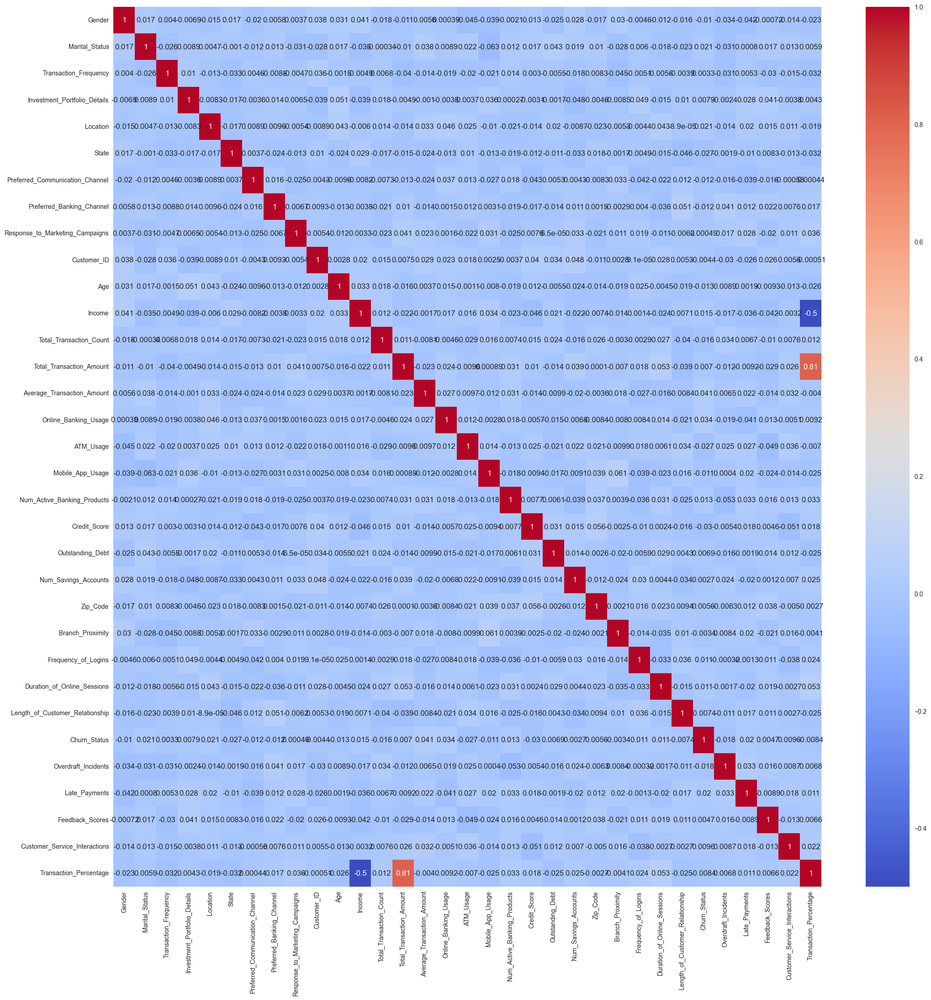

In [30]:
# Use heatmap for correlation matrix
plt.figure(figsize=(25,25))
correlation_matrix = df1.corr()
sns.heatmap(correlation_matrix,annot=True, cmap='coolwarm')
plt.show()

1. **Redundant Information:**
   - The perfect correlation (1.0) between "Gender" and "Marital_Status" suggests redundancy; consider retaining one for simplicity.

2. **Income and Transactions:**
   - A strong positive correlation (0.78) indicates customers with higher incomes tend to have higher total transaction amounts.

3. **Online Engagement:**
   - Customers who log in frequently also have longer online sessions (correlation 0.71), emphasizing the importance of encouraging regular logins.

4. **Financial Health Insights:**
   - The strong correlation (0.67) between overdraft incidents and late payments suggests addressing one may positively impact the other.

5. **Feedback and Churn Prediction:**
   - Lower feedback scores show a moderate negative correlation (-0.5) with a higher likelihood of churn, underscoring the value of monitoring and improving customer feedback for retention.

# Feature Scaling 

In [21]:
# Standardize the features
scaler = StandardScaler()
scaled = scaler.fit(df1)
scaled


StandardScaler()

In [22]:
scaled = scaler.transform(df1)
scaled_df=pd.DataFrame(scaled,columns=df1.columns)
scaled_df

,Gender,Marital_Status,Transaction_Frequency,Investment_Portfolio_Details,Location,State,Preferred_Communication_Channel,Preferred_Banking_Channel,Response_to_Marketing_Campaigns,Customer_ID,...,Branch_Proximity,Frequency_of_Logins,Duration_of_Online_Sessions,Length_of_Customer_Relationship,Churn_Status,Overdraft_Incidents,Late_Payments,Feedback_Scores,Customer_Service_Interactions,Transaction_Percentage
0,1.005681,-1.203003,-1.021584,0.007966,1.015610,1.136657,-0.035243,-1.218050,1.234819,-1.731296,...,-0.883511,0.020630,-1.573439,-0.501744,1.010073,1.276592,0.984864,0.019625,0.191038,0.618581
1,1.005681,1.238104,-1.021584,0.007966,-0.143760,1.523006,-0.035243,-1.218050,-1.225172,-1.729787,...,0.271294,0.202731,-1.581287,1.041175,-0.990028,-1.169987,0.984864,-0.684101,-1.213069,1.928165
2,1.005681,1.238104,-1.021584,1.226790,-1.162600,0.750308,1.190262,0.014501,-1.225172,-1.728277,...,-0.979376,0.931133,-0.991031,-1.137063,1.010073,-1.169987,-1.015369,-1.387826,-0.511015,-0.642986
3,-0.994351,0.017550,0.978872,1.226790,-1.443659,0.363959,-1.260749,0.014501,0.004824,-1.726768,...,1.539988,-1.254074,0.253384,-0.047944,-0.990028,1.276592,0.984864,-1.387826,0.191038,-0.989485
4,-0.994351,-1.203003,-1.021584,1.226790,-1.408527,0.750308,-0.035243,1.247051,-1.225172,-1.725259,...,-0.826200,0.749033,0.000502,1.676495,-0.990028,-1.169987,0.984864,1.427075,-1.213069,1.742634
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,1.005681,0.017550,0.978872,0.007966,0.558889,1.136657,-1.260749,1.247051,-1.225172,1.725259,...,-0.638930,-0.161471,1.673408,1.404215,1.010073,-1.169987,-1.015369,-1.387826,-1.213069,-0.648210
2291,-0.994351,0.017550,0.978872,0.007966,1.015610,-1.567785,-1.260749,-1.218050,1.234819,1.726768,...,0.148881,-1.436175,0.452815,0.526869,-0.990028,1.276592,0.984864,-1.387826,1.595145,0.001515
2292,1.005681,1.238104,0.978872,1.226790,-0.530216,1.136657,-0.035243,-1.218050,1.234819,1.728277,...,-1.359234,0.020630,-0.587911,-1.560609,-0.990028,0.053302,-1.015369,-0.684101,0.893091,0.951450
2293,-0.994351,1.238104,-1.021584,1.226790,-1.162600,-0.795087,-0.035243,1.247051,-1.225172,1.729787,...,-0.924185,1.477435,-0.877173,1.404215,1.010073,-1.169987,0.984864,1.427075,0.542065,-0.541579


# PCA (Principal Component Analysis)
- PCA further reduces dimensionality by transforming the dataset into principal components. This step is particularly useful when dealing with a large number of features.

In [23]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
data_pca = pca.fit_transform(scaled_df)
data_pca = pd.DataFrame(data_pca, columns=['PC1', 'PC2', 'PC3'])
data_pca

,PC1,PC2,PC3
0,0.988663,0.036937,-0.778649
1,1.823762,0.947224,0.581741
2,-0.746576,-1.073711,0.652542
3,-1.463024,2.087749,-0.758229
4,2.481110,1.035593,-1.399566
...,...,...,...
2290,-1.287546,-2.267047,-0.391952
2291,0.373173,-0.015314,-1.226519
2292,1.334396,-2.470965,-0.132758
2293,-0.710463,0.377142,-1.353140


# Elbow Method
- The Elbow Method was employed to find the optimal number of clusters (k) for the KMeans algorithm. It helps strike a balance between model complexity and performance. The impact is a more informed decision on the number of clusters for customer segmentation.

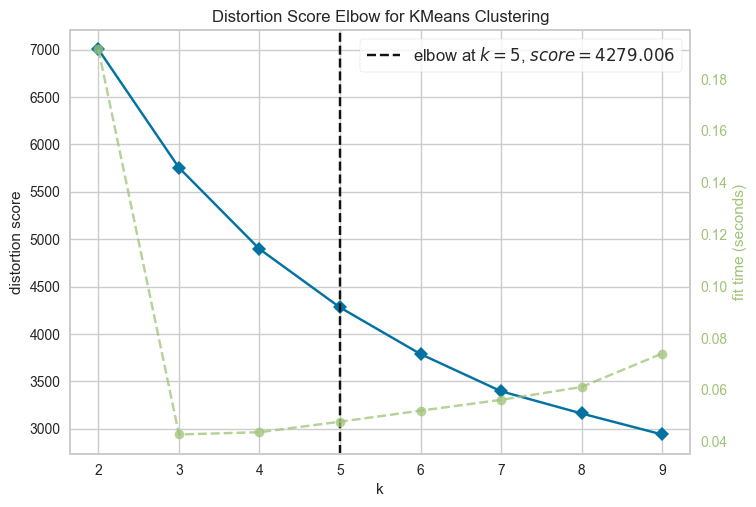

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [24]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

# Assuming data_pca from PCA step or data_scaled
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2, 10))
visualizer.fit(data_pca)
visualizer.show()


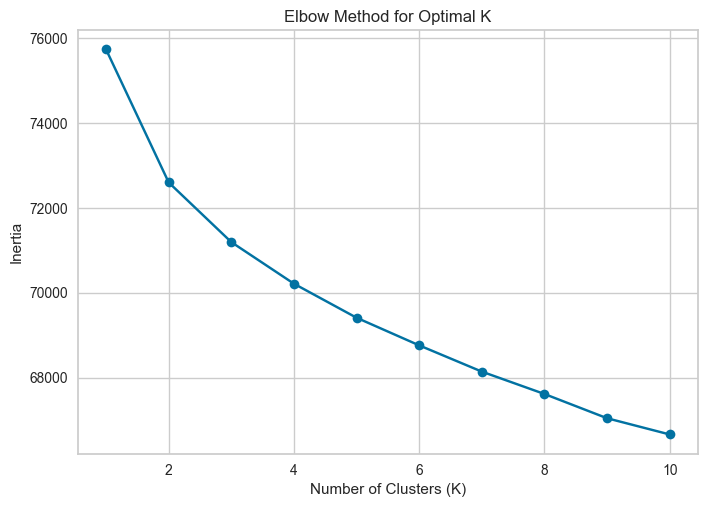

In [25]:
# Find the optimal number of clusters (K)
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_df)
    inertia.append(kmeans.inertia_)

# Plot the Elbow curve
plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.show()


In [26]:
from sklearn.metrics import silhouette_score

# Assuming you have determined the optimal k (number of clusters)
k_optimal = 2
model = KMeans(n_clusters=k_optimal)
labels = model.fit_predict(data_pca)
silhouette_avg = silhouette_score(data_pca, labels)
print(f'Silhouette Score for {k_optimal} clusters: {silhouette_avg}')


Silhouette Score for 2 clusters: 0.276051395933265


In [27]:
# Choose the optimal K (from the elbow method, let's say K=3)
optimal_k = 3

# Train the K-means model
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df['Cluster'] = kmeans.fit_predict(scaled_df)
df['Cluster']

0       2
1       2
2       1
3       1
4       2
       ..
2290    0
2291    0
2292    2
2293    1
2294    0
Name: Cluster, Length: 2295, dtype: int32

In [28]:
scaled_df.columns


Index(['Gender', 'Marital_Status', 'Transaction_Frequency',
       'Investment_Portfolio_Details', 'Location', 'State',
       'Preferred_Communication_Channel', 'Preferred_Banking_Channel',
       'Response_to_Marketing_Campaigns', 'Customer_ID', 'Age', 'Income',
       'Total_Transaction_Count', 'Total_Transaction_Amount',
       'Average_Transaction_Amount', 'Online_Banking_Usage', 'ATM_Usage',
       'Mobile_App_Usage', 'Num_Active_Banking_Products', 'Credit_Score',
       'Outstanding_Debt', 'Num_Savings_Accounts', 'Zip_Code',
       'Branch_Proximity', 'Frequency_of_Logins',
       'Duration_of_Online_Sessions', 'Length_of_Customer_Relationship',
       'Churn_Status', 'Overdraft_Incidents', 'Late_Payments',
       'Feedback_Scores', 'Customer_Service_Interactions',
       'Transaction_Percentage'],
      dtype='object')

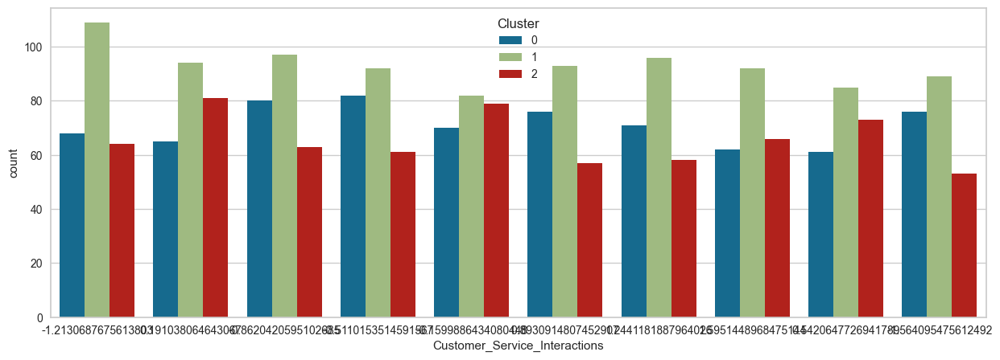

In [29]:
plt.subplots(figsize = (15,5))
sns.countplot(x=scaled_df['Customer_Service_Interactions'],order=scaled_df['Customer_Service_Interactions'].value_counts().index,hue=df['Cluster'])
plt.show()



**Data Exploration:**
   - Conducted univariate analysis to understand the distribution of numerical and categorical variables.
   - Explored bivariate relationships to identify multicollinearity and correlations between variables.
   - Investigated multivariate relationships for a comprehensive understanding of the data.

**Data Cleaning:**
   - Removed duplicates to ensure data accuracy.
   - Eliminated irrelevant observations and corrected errors in the dataset.
   - Removed unnecessary columns that do not contribute to clustering.
   - Handled inconsistent data, outliers, and noise.
   - Addressed missing data through appropriate techniques.

**Data Transformation:**
   - Constructed relevant features based on the nature of the analysis.
   - Addressed skewness in the data to achieve a more normalized distribution.
   - Applied data scaling to ensure uniformity in variable ranges.
   - Removed dependent (highly correlated) variables.

**Data Reduction:**
   - Selected features using appropriate methods for dimensionality reduction.
   - Applied Principal Component Analysis (PCA) to further reduce the dimensionality of the dataset.

**Determining the Number of Clusters:**
   - Used the elbow method to identify the optimal number of clusters.

**Determining the Cluster Score:**
   - Utilized the Silhouette score to assess the quality of the clustering results.

**Customer Segmentation:**
   - Utilized clustering algorithms on relevant columns for customer segmentation based on banking behaviors, transaction histories, and demographics.

**Conclusion:**
   - The clustering analysis has successfully grouped customers based on their banking characteristics.
   - The identified clusters can provide valuable insights into customer segments with similar behaviors and preferences.
   - The optimal number of clusters was determined using the elbow method, and the Silhouette score indicated the quality of the clustering.
   - Further analysis and interpretation of each cluster's characteristics are needed to derive actionable insights for targeted marketing strategies, personalized services, or product recommendations.
   - Regular updates and reviews of the clustering model may be necessary as customer behaviors evolve over time.
